# <font color='yellow'> Análise e Classificação das Obras de Fernando Pessoa </font>

**Objetivo:**
Classificar textos de Fernando Pessoa entre heterônimos (Alberto Caeiro, Ricardo Reis, Álvaro de Campos, Bernardo Soares).


**Fonte:**
http://arquivopessoa.net/textos

## <font color="turquoise"> Preparação do Ambiente </font>
- Instalação de pacotes necessários.
- Importação das bibliotecas.

    

In [1]:
!pip install requests beautifulsoup4 unidecode langdetect

# Instalação e download dos modelos para a lematização
!pip install spacy
!python -m spacy download en_core_web_sm   # inglês
!python -m spacy download pt_core_news_lg  # português

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 42.7 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.2/568.2 MB 1.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [2]:
# ========================================================================
# BIBLIOTECAS PARA REQUISIÇÕES WEB E COLETA DE DADOS (WEB SCRAPING)
# ========================================================================
import requests                     # Envia requisições HTTP (GET/POST) para acessar páginas ou APIs
from bs4 import BeautifulSoup       # Faz parsing de HTML/XML e extrai dados estruturados das páginas
import time                         # Mede tempo de execução e controla pausas entre requisições

# ========================================================================
# BIBLIOTECAS PARA MANIPULAÇÃO E ANÁLISE DE DADOS
# ========================================================================
import pandas as pd                 # Estruturas de dados em DataFrames e funções de análise tabular
from collections import Counter     # Contagem rápida de elementos em listas ou iteráveis
import json                         # Leitura e gravação de arquivos/dados no formato JSON
import numpy as np                  # Operações matemáticas avançadas e manipulação eficiente de arrays

# ========================================================================
# BIBLIOTECAS PARA VISUALIZAÇÃO DE DADOS
# ========================================================================
import matplotlib.pyplot as plt      # Criação de gráficos básicos (linhas, barras, dispersão, etc.)
import matplotlib.ticker as mticker  # Personaliza e formata rótulos/números nos eixos dos gráficos
import seaborn as sns                # Gráficos estatísticos com estilos aprimorados (heatmaps, boxplots…)
from wordcloud import WordCloud      # Geração de nuvens de palavras a partir de textos
from IPython.display import display, HTML  # Exibe objetos e HTML de forma interativa no Jupyter Notebook

# ========================================================================
# BIBLIOTECAS PARA PROCESSAMENTO DE TEXTO (NLP)
# ========================================================================
import nltk                          # Toolkit para tarefas de NLP (tokenização, stemming, etc.)
from nltk.tokenize import sent_tokenize, word_tokenize  # Quebra textos em sentenças e palavras
from nltk.corpus import stopwords    # Conjunto de palavras irrelevantes (“stopwords”) para análise textual
import string                        # Funções auxiliares para manipulação de strings e pontuação
from langdetect import detect        # Detecta o idioma de um texto automaticamente
import spacy                         # NLP avançado (lemmatização, POS tagging, parsing…)
from unidecode import unidecode      # Remove acentos e caracteres especiais (normalização)

# Downloads necessários do NLTK (apenas uma vez)
nltk.download('punkt')               # Modelo de tokenização padrão
nltk.download('punkt_tab')           # Pacote adicional exigido em versões recentes do NLTK
nltk.download('stopwords')           # Lista de stopwords em vários idiomas

# ========================================================================
# BIBLIOTECAS PARA MACHINE LEARNING E SIMILARIDADE TEXTUAL
# ========================================================================
from sklearn.feature_extraction.text import TfidfVectorizer  # Converte textos em vetores numéricos TF-IDF
from sklearn.metrics.pairwise import cosine_similarity       # Calcula similaridade de cosseno entre vetores

# Modelos e algoritmos de classificação
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# Métricas de avaliação de modelos
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## <font color="turquoise"> Coleta de Dados </font>
- Web scraping
- Salvar a lista `poesias` em um arquivo JSON
- Carregar arquivo JSON e transformar em um dataframe

In [3]:
# Criado por Thais Garcia 10/09/2025

def extract_data(page):
    parser = BeautifulSoup(page.content, 'html.parser')

    # Extração do autor
    author = parser.find('div', class_='autor').text.strip()

    # Extração do título
    title = parser.find('h1', class_='titulo-texto').text.strip()

    # Extração do texto
    text_element = parser.find('div', class_='texto-poesia')
    if text_element:
        text = text_element.text.strip()
    else:
        text = None

    # Retorna os dados extraídos
    return {
        'author': author,
        'title': title,
        'text': text
    }

# Lista que armazena dicionários contendo dados de poesias extraídas do site.
poesias = []

i = 0
erros_404_consecutivos = 0  # Contador de páginas 404 consecutivas
limite_404 = 10  # Número máximo de erros 404 consecutivos antes de parar
timeout_seconds = 10  # Adicionado: Tempo limite em segundos para cada requisição

while True:
    url = f'http://arquivopessoa.net/textos/{i}'
    print(f'Analisando dados da página {i}')

    try:
        # Adicionado: timeout para a requisição
        page = requests.get(url, timeout=timeout_seconds)

        # Se o status da página for 200, os dados são extraídos.
        if page.status_code == 200:
            data = extract_data(page)

            # Verifica se o texto foi encontrado
            if data['text']:
                print(f'Extraindo dados da página {i}')
                poesias.append(data)

            i += 1
            erros_404_consecutivos = 0  # Reset ao encontrar uma página válida
            time.sleep(0.5) # Adicionado: Pequena pausa entre requisições

        elif erros_404_consecutivos >= limite_404:
          print("Muitas páginas 404 consecutivas. Parando a execução.")
          break  # Sai do loop se atingir o limite de páginas não encontradas

        # Se o status da página for 404, continua para a próxima página.
        elif page.status_code == 404:
            print(f'Página {i} não encontrada (404). Tentando a próxima página.')
            erros_404_consecutivos += 1
            i += 1
            time.sleep(0.5) # Adicionado: Pequena pausa mesmo em 404

        # Caso o servidor retorne um erro 503, espera e tenta novamente.
        elif page.status_code == 503:
            t = 5  # Aumentado o tempo de espera para 503
            print(f'Erro 503. Tentando novamente buscar a página {i} em {t} segundos.')
            time.sleep(t)

        # Se houver outro tipo de erro, também continua para a próxima página.
        else:
            print(f'Erro {page.status_code} ao buscar a página {i}. Tentando a próxima página.')
            i += 1
            time.sleep(0.5) # Adicionado: Pequena pausa para outros erros

    except requests.exceptions.Timeout:
        print(f"Requisição para a página {i} expirou. Pulando para a próxima página.")
        i += 1
        time.sleep(1) # Adicionado: Pausa maior após timeout

    except requests.exceptions.RequestException as e:
        print(f"Ocorreu um erro na requisição para a página {i}: {e}. Pulando para a próxima página.")
        i += 1
        time.sleep(1) # Adicionado: Pausa maior após outros erros de requisição

A saída de streaming foi truncada nas últimas 5000 linhas.
Analisando dados da página 1062
Extraindo dados da página 1062
Analisando dados da página 1063
Extraindo dados da página 1063
Analisando dados da página 1064
Extraindo dados da página 1064
Analisando dados da página 1065
Extraindo dados da página 1065
Analisando dados da página 1066
Analisando dados da página 1067
Analisando dados da página 1068
Extraindo dados da página 1068
Analisando dados da página 1069
Extraindo dados da página 1069
Analisando dados da página 1070
Analisando dados da página 1071
Analisando dados da página 1072
Analisando dados da página 1073
Extraindo dados da página 1073
Analisando dados da página 1074
Extraindo dados da página 1074
Analisando dados da página 1075
Extraindo dados da página 1075
Analisando dados da página 1076
Analisando dados da página 1077
Extraindo dados da página 1077
Analisando dados da página 1078
Analisando dados da página 1079
Analisando dados da página 1080
Extraindo dados da pági

In [4]:
# Salvando a lista em um arquivo JSON para não precisar fazer o Web scraping novamente
with open('poesias.json', 'w', encoding='utf-8') as f:
    json.dump(poesias, f, ensure_ascii=False, indent=4)

In [5]:
# Carregamento do arquivo JSON
with open('poesias.json', 'r', encoding='utf-8') as f:
    poesias_geral = json.load(f)

In [6]:
poesias_geral

[{'author': 'Ricardo Reis',
  'title': 'Diana através dos ramos',
  'text': 'Diana através dos ramos\nEspreita a vinda de Endymion\nEndymion que nunca vem,\nEndymion, Endymion,\nLá longe na floresta…\nE a sua voz chamando\nExclama através dos ramos\nEndymion, Endymion…\n\nAssim choram os deuses…'},
 {'author': 'Ricardo Reis',
  'title': 'Aqui, sem outro Apolo do que Apolo,',
  'text': 'Aqui, sem outro Apolo do que Apolo,\nSem um suspiro abandonemos Cristo\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0E a febre de buscarmos\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0Um deus dos dualismos.\n\nE longe da cristã sensualidade\nQue a casta calma da beleza antiga\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0Nos restitua o antigo\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0Sentimento da vida.'},
 {'author': 'Ricardo Reis',
  'title': 'Em Ceres anoitece.',
  'text': 'Em Ceres anoitece.\nNos píncaros ainda\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0Faz luz.\n\nSinto-me tão grande\nNesta hora solene\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0E vã\n\nQue, assim 

In [7]:
print(f"Total de poesias no site: {len(poesias_geral)}")

Total de poesias no site: 2090


In [8]:
autores_poemas = Counter([poesia['author'] for poesia in poesias_geral])
print(f"Número de autores: {len(autores_poemas)}")
print("\nQuantidade de poemas por autor:")
for autor, quantidade in autores_poemas.items():
    print(f"{autor}: {quantidade}")

Número de autores: 18

Quantidade de poemas por autor:
Ricardo Reis: 253
Fernando Pessoa: 1305
Álvaro de Campos: 323
Joaquim Moura Costa: 8
Carlos Otto: 2
Alberto Caeiro: 120
Alexander Search: 52
Charles Robert Anon: 9
Eduardo Lança: 1
António Mora: 1
Wardour + Pessoa: 1
J. H. Hyslop: 1
Dr. Pancrácio: 4
Vicente Guedes: 1
Bernardo Soares: 6
Vadooisf: 1
David Merrick: 1
Íbis: 1


Possui heterônimos, semi-heterônimos e pseudônimos.

In [9]:
# Criação do DataFrame com os heterônimos
df = pd.DataFrame(poesias_geral)
df = df[['text', 'title', 'author']]
df.columns = ['texto', 'titulo', 'autor']

display(df.head())

,texto,titulo,autor
0,Diana através dos ramos\nEspreita a vinda de E...,Diana através dos ramos,Ricardo Reis
1,"Aqui, sem outro Apolo do que Apolo,\nSem um su...","Aqui, sem outro Apolo do que Apolo,",Ricardo Reis
2,Em Ceres anoitece.\nNos píncaros ainda\n ...,Em Ceres anoitece.,Ricardo Reis
3,"Não a ti, mas aos teus, odeio, Cristo.\nTu não...","Não a ti, mas aos teus, odeio, Cristo.",Ricardo Reis
4,O burburinho da água\n\nO burburinho da água\n...,O burburinho da água,Fernando Pessoa


In [10]:
print(f"Número total de registros: {len(df)}")

Número total de registros: 2090


## <font color="turquoise"> Exploração Inicial (EDA) </font>
- Quantidade de registros.

- Distribuição por classe (heterônimos).

- Comprimento médio dos textos.

- Frequência de palavras.

- Detectar inconsistências.

In [11]:
# Estatísticas básicas
print("Estatísticas básicas:")
display(df.describe())

Estatísticas básicas:


,texto,titulo,autor
count,2090,2090,2090
unique,2089,2076,18
top,"Severo narro. Quanto sinto, penso.\nPalavras s...","O horror sórdido do que, a sós consigo,",Fernando Pessoa
freq,2,4,1305


    - Total de 2090 linhas (poemas).
    - Desses textos, 2089 são únicos (ou seja, um texto se repete).
    - Dos títulos, 2076 são únicos (ou seja, alguns títulos repetidos).
    - O autor mais frequente é Fernando Pessoa com 1305 textos.

In [12]:
print("Contagem de valores nulos por coluna:")
display(df.isnull().sum())

Contagem de valores nulos por coluna:


,0
texto,0
titulo,0
autor,0


In [13]:
print("Número de textos duplicados:")
print(df.duplicated(subset=['texto']).sum())

Número de textos duplicados:
1


In [14]:
display(df[df.duplicated(subset=['texto'], keep=False)])

,texto,titulo,autor
207,"Severo narro. Quanto sinto, penso.\nPalavras s...","Severo narro. Quanto sinto, penso.",Ricardo Reis
291,"Severo narro. Quanto sinto, penso.\nPalavras s...","Severo narro. Quanto sinto, penso.",Ricardo Reis


In [15]:
df = df.drop_duplicates(subset=['texto'], keep='first')

print(f"Número de registros após remover o texto duplicado: {len(df)}")

Número de registros após remover o texto duplicado: 2089


/tmp/ipython-input-1286878296.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='autor', data=df, palette='viridis')


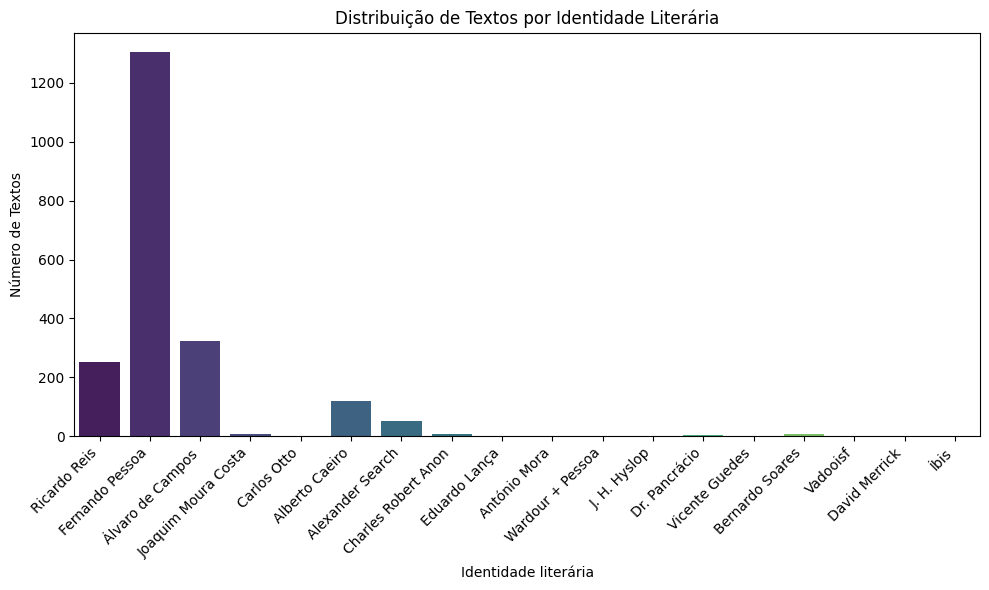

In [16]:
# Histograma de número de textos por heterônimo
plt.figure(figsize=(10, 6))
sns.countplot(x='autor', data=df, palette='viridis')
plt.xlabel('Identidade literária')
plt.ylabel('Número de Textos')
plt.title('Distribuição de Textos por Identidade Literária')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

O principal insight desta etapa exploratória é a confirmação da necessidade do pré-processamento. As palavras mais frequentes, como 'que', 'não' e 'de', são conectivos da língua portuguesa que, por sua alta frequência, dominam a visualização e escondem os termos verdadeiramente significativos.

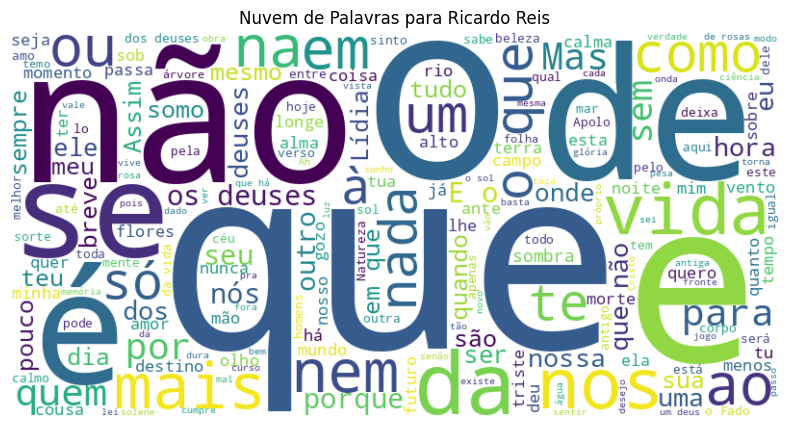

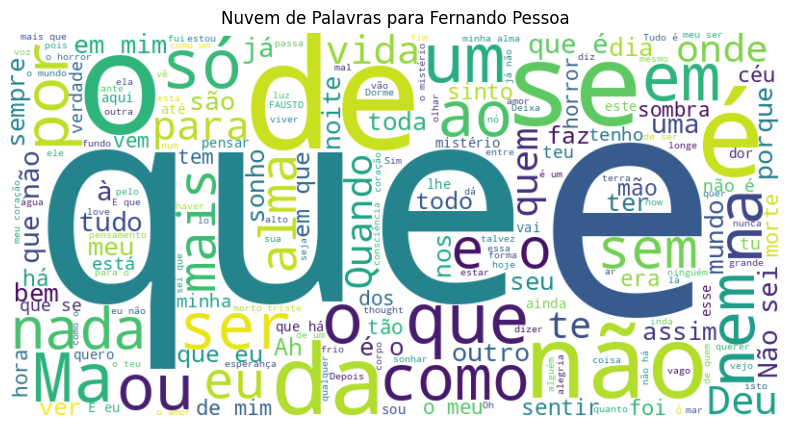

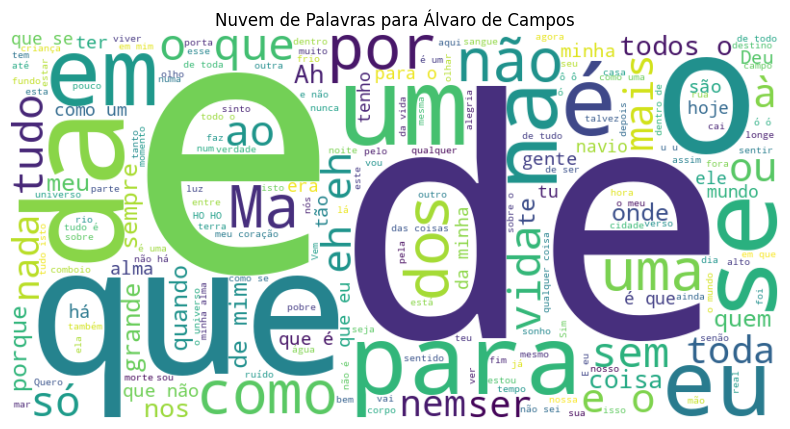

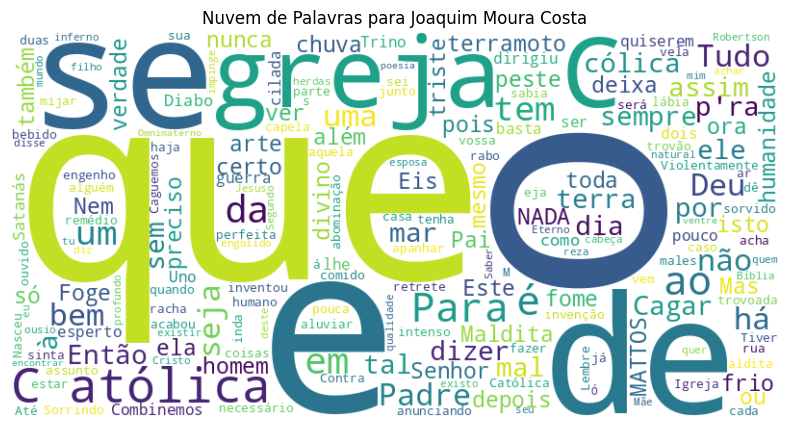

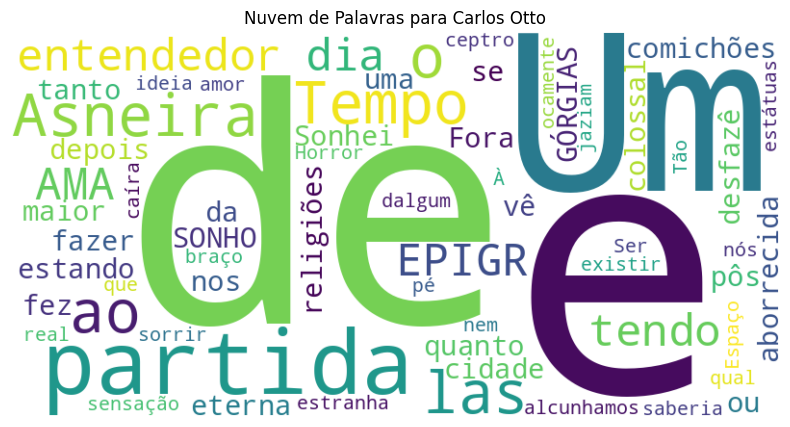

...

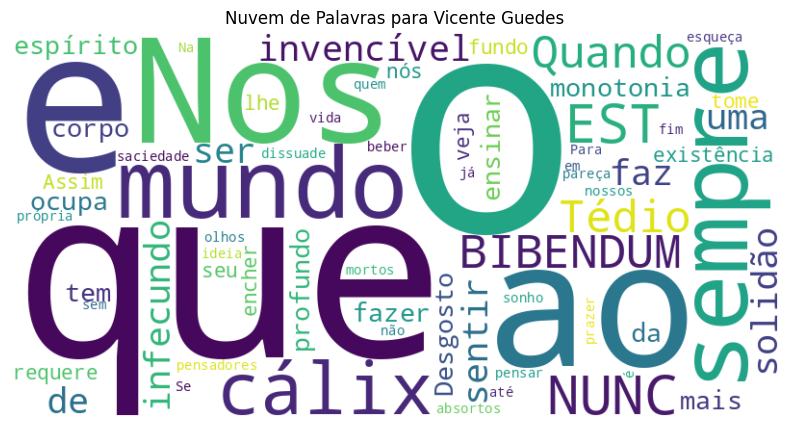

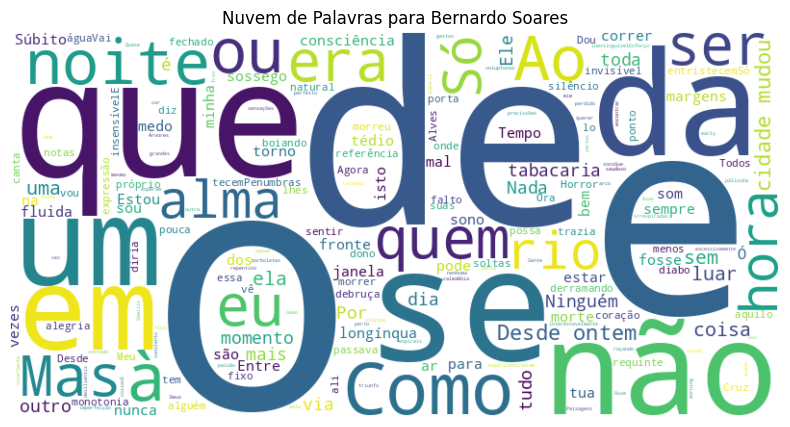

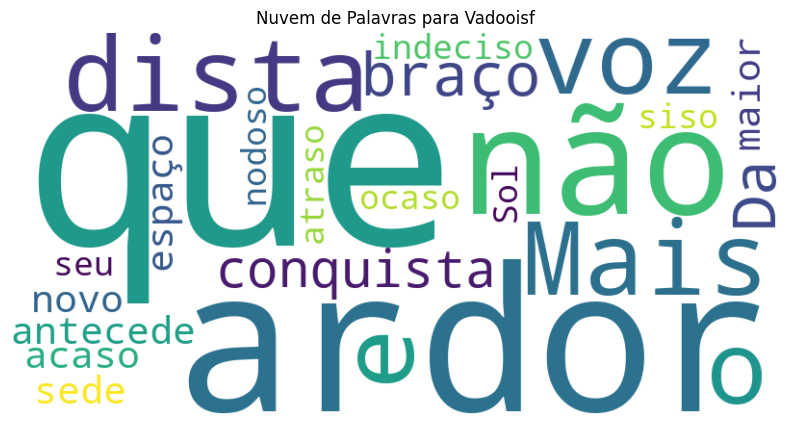

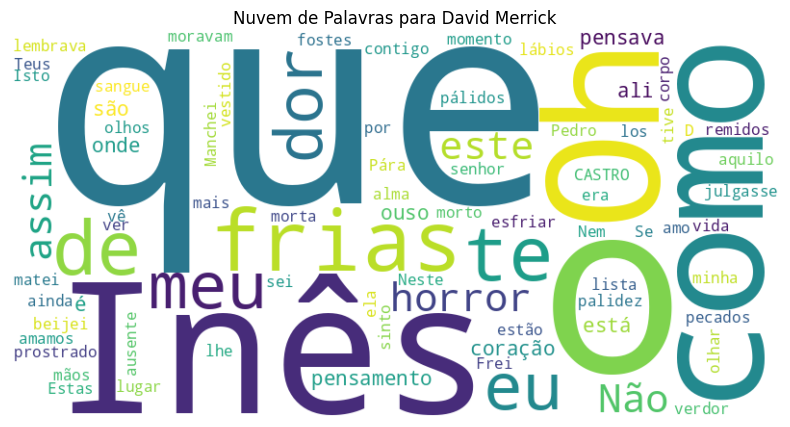

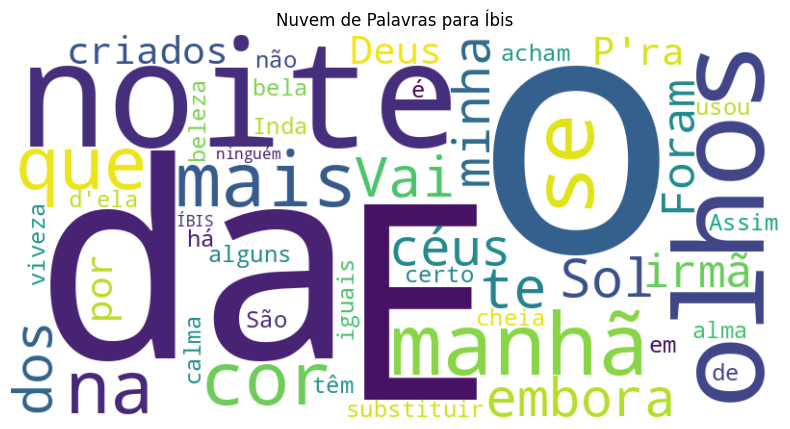

In [17]:
# Nuvem de palavras por heterônimo
autores = df['autor'].unique()

for autor in autores:
    textos_autor = ' '.join(df[df['autor'] == autor]['texto'].dropna())
    if textos_autor:
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(textos_autor)

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Nuvem de Palavras para {autor}')
        plt.show()

        # quebra visual entre gráficos
        display(HTML("<br><br>"))

O comprimento médio dos textos é matematicamente:

$$
\text{média} = \frac{\text{soma do número de palavras/tokens de todos os textos}}{\text{quantidade total de textos}}
$$

In [18]:
# Comprimento médio dos textos
df['comprimento_texto'] = df['texto'].apply(lambda x: len(x.split()))
comprimento_medio = df['comprimento_texto'].mean()
print(f"\nComprimento médio dos textos: {comprimento_medio:.2f} palavras")


Comprimento médio dos textos: 107.67 palavras


Ou seja, cada texto tem em média cerca de 108 palavras.

## <font color="turquoise"> Limpeza e Pré-processamento do Texto </font>
- Remoção de duplicatas, símbolos ou textos irrelevantes.

- Normalização de caracteres.

- Tokenização, remoção de stopwords, lematização, etc.

Fernando Pessoa escreve poemas e textos em que nomes próprios, siglas, títulos e termos específicos podem ser fundamentais para diferenciar obras.

In [19]:
df['texto'] = df['texto'].str.replace(r'\\n', ' ', regex=True) # Substituindo '\n' por espaço antes de limpar

df['texto_limpo'] = (df['texto']
    .apply(lambda x: unidecode(x))                      # Remove acentos e cedilhas
    .str.replace(r'\d+', '', regex=True)                # Remove todos os números
    .str.replace(r'[^a-zA-Z\s]', ' ', regex=True)       # Mantém só letras (maiúsculas e minúsculas) e espaços
    .str.replace(r'\s+', ' ', regex=True)               # Substitui múltiplos espaços
    .str.strip()                                        # Remove espaços extras no início e no fim da string
)

display(df[['texto', 'texto_limpo']].head())

,texto,texto_limpo
0,Diana através dos ramos\nEspreita a vinda de E...,Diana atraves dos ramos Espreita a vinda de En...
1,"Aqui, sem outro Apolo do que Apolo,\nSem um su...",Aqui sem outro Apolo do que Apolo Sem um suspi...
2,Em Ceres anoitece.\nNos píncaros ainda\n ...,Em Ceres anoitece Nos pincaros ainda Faz luz S...
3,"Não a ti, mas aos teus, odeio, Cristo.\nTu não...",Nao a ti mas aos teus odeio Cristo Tu nao es m...
4,O burburinho da água\n\nO burburinho da água\n...,O burburinho da agua O burburinho da agua No r...


In [20]:
# Carregar modelos do spaCy
nlp_en = spacy.load("en_core_web_sm")
nlp_pt = spacy.load("pt_core_news_lg")

def preprocessar(texto_limpo):
    # Detectar idioma
    idioma = detect(texto_limpo)

    # Tokenizar
    tokens = word_tokenize(texto_limpo)

    # Escolher stopwords
    stop_words = stopwords.words('english') if idioma == 'en' else stopwords.words('portuguese')

    # Remover stopwords e não alfabéticos
    tokens_filtrados = [t for t in tokens if t.isalpha() and t.lower() not in stop_words]

    # Lematização com spaCy
    doc = nlp_en(" ".join(tokens_filtrados)) if idioma == 'en' else nlp_pt(" ".join(tokens_filtrados))
    lemas = [token.lemma_ for token in doc]

    return lemas

df['tokens_lemmatizados'] = df['texto_limpo'].apply(preprocessar)
display(df[['texto_limpo', 'tokens_lemmatizados']].head())

,texto_limpo,tokens_lemmatizados
0,Diana atraves dos ramos Espreita a vinda de En...,"[Diana, atraves, ramos, Espreita, vindar, Endy..."
1,Aqui sem outro Apolo do que Apolo Sem um suspi...,"[aqui, outro, Apolo, Apolo, suspiro, abandonem..."
2,Em Ceres anoitece Nos pincaros ainda Faz luz S...,"[Ceres, anoitecer, pincaro, ainda, Fazer, luz,..."
3,Nao a ti mas aos teus odeio Cristo Tu nao es m...,"[nao, ti, odeio, Cristo, nao, es, deus, eterno..."
4,O burburinho da agua O burburinho da agua No r...,"[burburinho, aguo, burburinho, aguo, regato, e..."


**Word Cloud após a remoção de stopwords e lematização:**

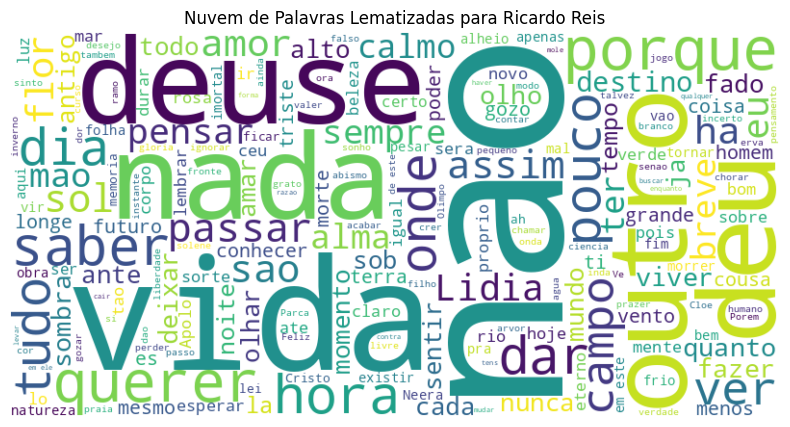

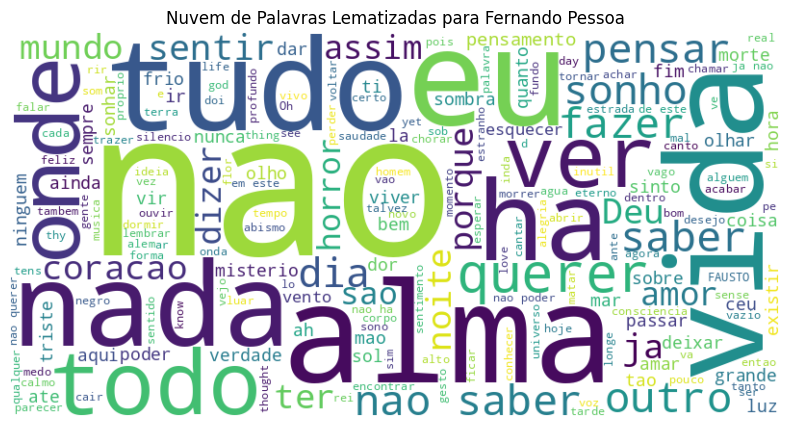

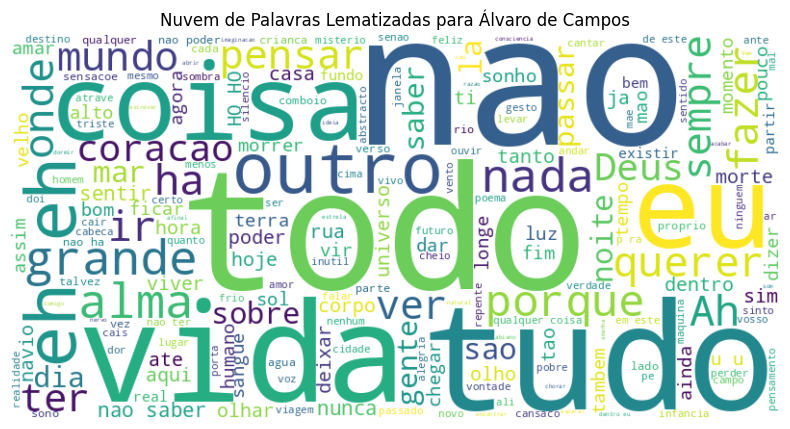

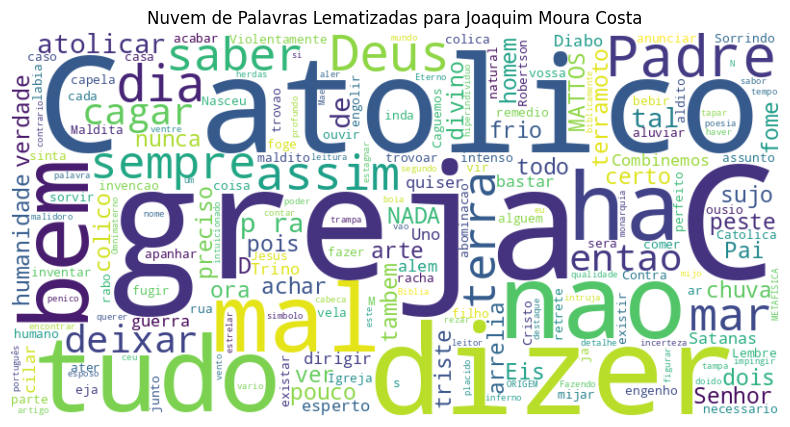

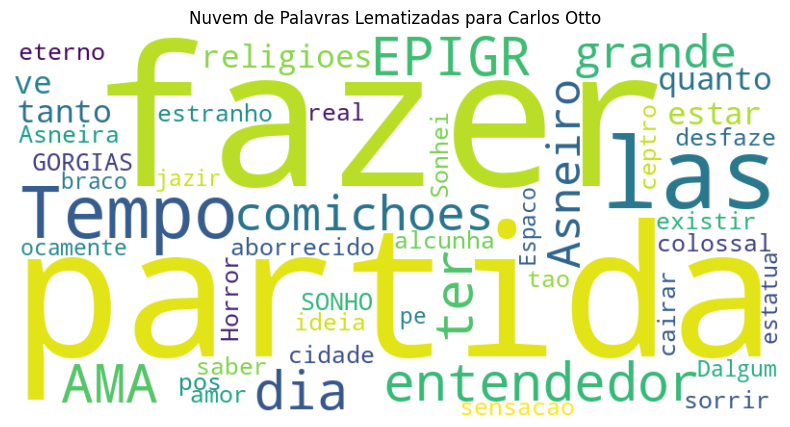

...

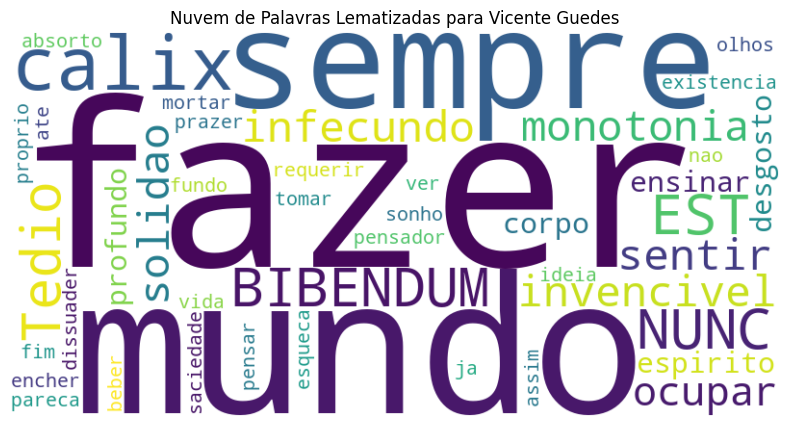

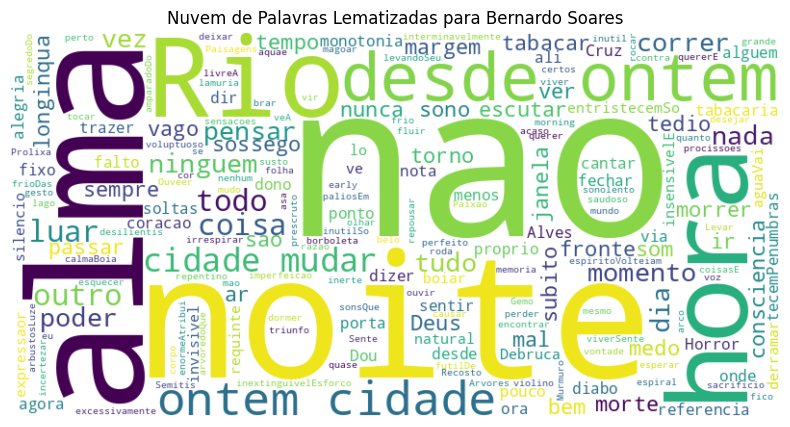

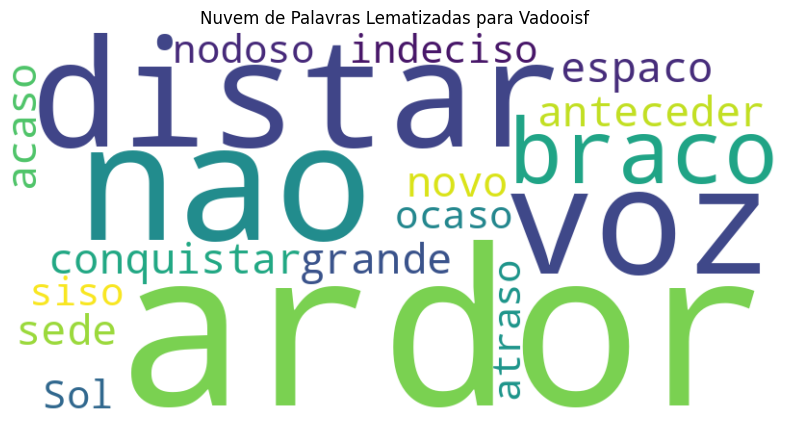

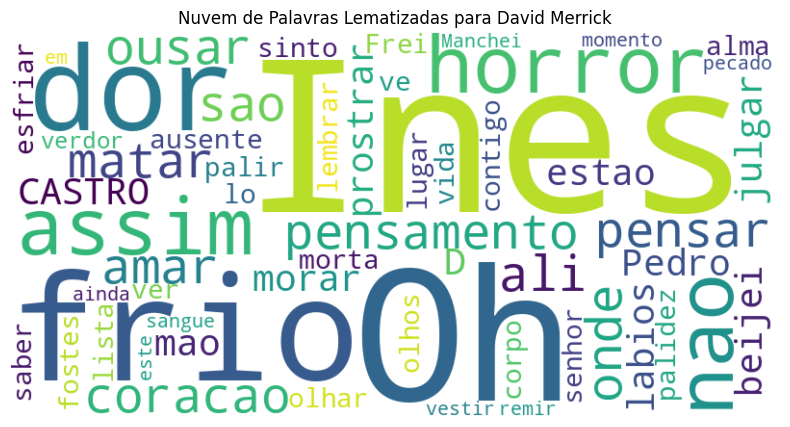

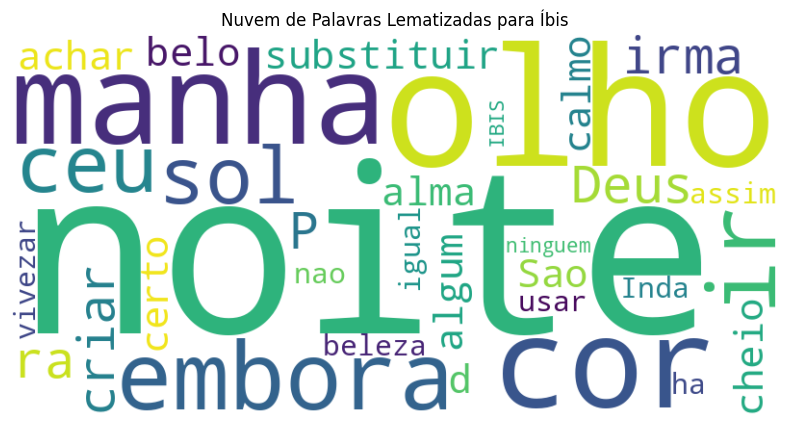

In [21]:
# Nuvem de palavras por autor (após lematização)
for autor in autores:
    # Filtrar o DataFrame para o autor atual
    df_autor = df[df['autor'] == autor].copy()

    if not df_autor.empty:
        # Juntar todos os tokens lematizados do autor em uma única string
        textos_autor_lematizados = ' '.join([token for lista in df_autor['tokens_lemmatizados'] for token in lista])

        if textos_autor_lematizados:
            # Gerar a nuvem de palavras
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate(textos_autor_lematizados)

            # Plotar a nuvem de palavras
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Nuvem de Palavras Lematizadas para {autor}')
            plt.show()

            # Quebra visual entre gráficos
            display(HTML("<br><br>"))
        else:
            print(f"Nenhum texto lematizado encontrado para {autor}")
    else:
        print(f"Nenhum texto encontrado para {autor}")

In [22]:
# Comprimento médio dos textos após lematização
df['comprimento_texto_lematizado'] = df['tokens_lemmatizados'].apply(lambda x: len(x))
comprimento_medio_lematizado = df['comprimento_texto_lematizado'].mean()
print(f"\nComprimento médio dos textos após lematização: {comprimento_medio_lematizado:.2f} palavras")


Comprimento médio dos textos após lematização: 59.74 palavras


##  <font color="turquoise"> Análise Estatística de Vocabulário </font>
- Contar frequência de palavras e identificar os termos mais recorrentes.
- Aplicar POS-Tagging (Etiquetagem Gramatical).
- Comparar o uso de substantivos, verbos e adjetivos nas obras.

In [23]:
# Juntar todos os tokens lematizados em uma lista única
todos_tokens = [token for lista in df['tokens_lemmatizados'] for token in lista]

# Contar frequência
frequencia = Counter(todos_tokens)

# Mostrar os 10 termos mais comuns
print(frequencia.most_common(10))

[('nao', 3744), ('todo', 1117), ('saber', 1004), ('tudo', 987), ('vida', 982), ('eu', 861), ('so', 832), ('alma', 769), ('nada', 748), ('outro', 700)]


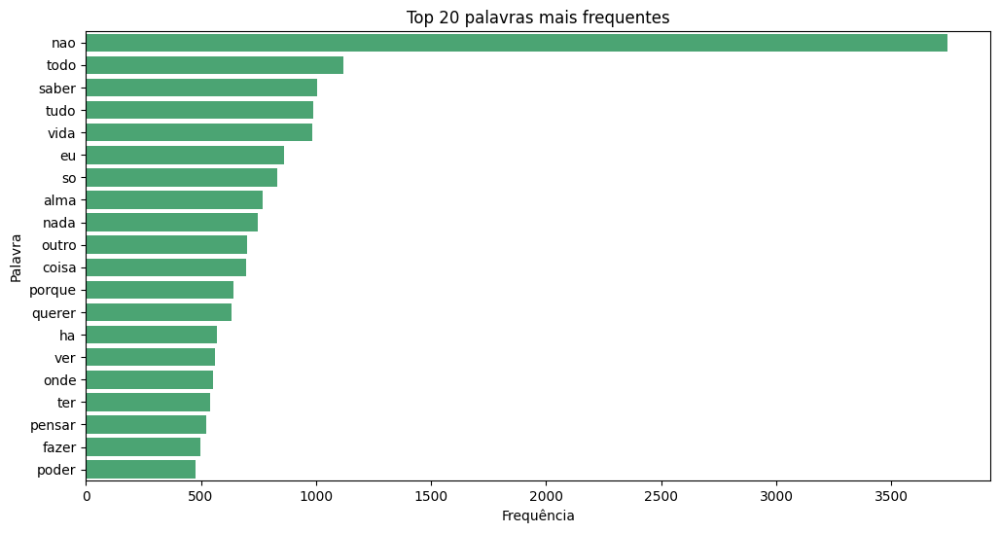

In [24]:
# Top 20 palavras mais frequentes
freq_df = pd.DataFrame(frequencia.most_common(20), columns=['Palavra', 'Frequência'])

# Gráfico
plt.figure(figsize=(12,6))
sns.barplot(
    x='Frequência',
    y='Palavra',
    data=freq_df,
    color='mediumseagreen',
    errorbar=None
)
plt.title('Top 20 palavras mais frequentes')
plt.xlabel('Frequência')
plt.ylabel('Palavra')
plt.show()

O POS-Tagging (Part-of-Speech Tagging) do spaCy já realiza a tokenização internamente, ou seja, ele identifica automaticamente os tokens (palavras) no texto e atribui a cada um a sua classe gramatical. Dinâmico,Descritivo.

In [25]:
# Função para contar POS (substantivos, verbos, adjetivos)
def contar_pos(texto):
    idioma = detect(texto)
    doc = nlp_en(texto) if idioma == 'en' else nlp_pt(texto)
    pos_counts = {"NOUN": 0, "VERB": 0, "ADJ": 0}
    for token in doc:
        if token.pos_ in pos_counts:
            pos_counts[token.pos_] += 1
    return pos_counts

# Aplicar em cada texto
df['pos_counts'] = df['texto_limpo'].apply(contar_pos)

# Somar tudo para ter a contagem geral
pos_total = df['pos_counts'].apply(pd.Series).sum()
print(pos_total)

NOUN    46663
VERB    31517
ADJ     13633
dtype: int64


/tmp/ipython-input-3558639510.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=pos_total.index, y=pos_total.values, palette='viridis')


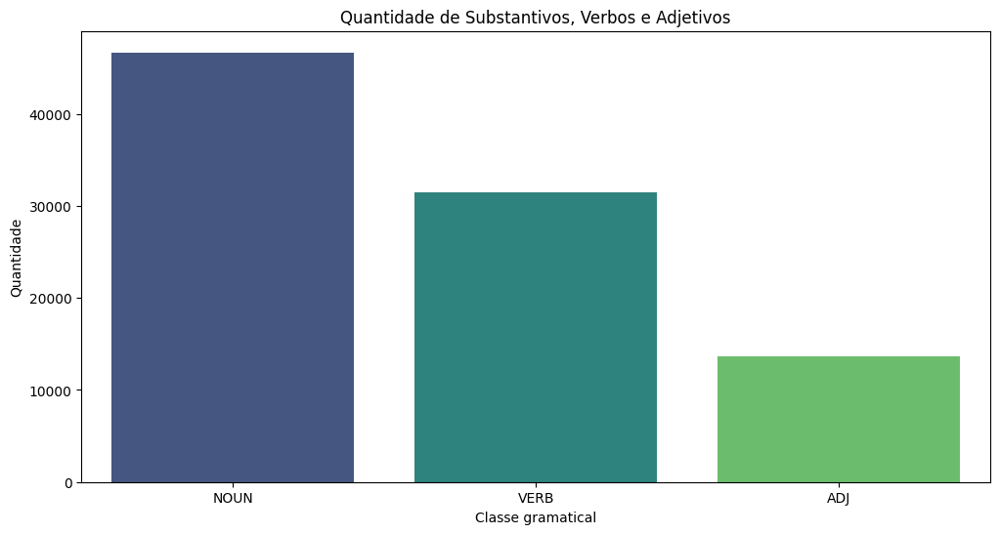

In [26]:
plt.figure(figsize=(12, 6))
sns.barplot(x=pos_total.index, y=pos_total.values, palette='viridis')
plt.title('Quantidade de Substantivos, Verbos e Adjetivos')
plt.xlabel('Classe gramatical')
plt.ylabel('Quantidade')
plt.show()

In [27]:
# Listas para armazenar tokens classificados por classe gramatical
substantivos = []
verbos = []
adjetivos = []

for lista in df['tokens_lemmatizados']:
    # Concatena os tokens em uma única string e processa com spaCy
    doc = nlp_pt(" ".join(lista))

    # Itera sobre cada token do objeto doc
    for token in doc:
        # Verifica a classe gramatical do token e adiciona à lista correspondente
        if token.pos_ == 'NOUN':       # se for substantivo
            substantivos.append(token.text)
        elif token.pos_ == 'VERB':     # se for verbo
            verbos.append(token.text)
        elif token.pos_ == 'ADJ':      # se for adjetivo
            adjetivos.append(token.text)

# Calcula o substantivo, verbo e adjetivo mais frequentes (comuns) usando Counter
substantivo_mais_comum = Counter(substantivos).most_common(1)[0][0] if substantivos else "Nenhum"
verbo_mais_comum = Counter(verbos).most_common(1)[0][0] if verbos else "Nenhum"
adjetivo_mais_comum = Counter(adjetivos).most_common(1)[0][0] if adjetivos else "Nenhum"

print("Substantivo mais comum: ", substantivo_mais_comum)
print("Verbo mais comum: ", verbo_mais_comum)
print("Adjetivo mais comum: ", adjetivo_mais_comum)

Substantivo mais comum:  vida
Verbo mais comum:  saber
Adjetivo mais comum:  grande


## <font color="turquoise"> Análise Sintática e Estilística </font>
- Comparar a estrutura gramatical das poesias.
- Calcular a proporção (%) de cada classe gramatical no total de palavras do poema.
- Criar um gráfico de barras da frequência das classes gramaticais para cada heterônimo.

Proporção das classes gramaticais nos textos:

$$
\text{proporção de cada POS} = \frac{\text{contagem de POS}}{\text{total de tokens do texto}}
$$


In [28]:
# Transforma o dicionário de cada texto em colunas
df_pos = df['pos_counts'].apply(pd.Series).fillna(0)

# Normaliza por número total de tokens do texto (proporção)
df_pos_norm = df_pos.div(df_pos.sum(axis=1), axis=0)

print(df_pos_norm.head())

       NOUN      VERB       ADJ
0  0.636364  0.363636  0.000000
1  0.600000  0.200000  0.200000
2  0.529412  0.352941  0.117647
3  0.475410  0.278689  0.245902
4  0.800000  0.200000  0.000000


**Filtrando o dataframe para exibir apenas os textos dos heterônimos:**

In [29]:
# Lista de heterônimos
heteronimos = ['Alberto Caeiro', 'Ricardo Reis', 'Álvaro de Campos', 'Bernardo Soares']

# Filtrar o DataFrame apenas para os heterônimos
df_heteronimos = df[df['autor'].isin(heteronimos)].copy()

# Agrupar por autor e somar os dicionários
pos_heteronimos = df_heteronimos.groupby('autor')['pos_counts'].apply(
    lambda x: sum((Counter(d) for d in x), Counter())
).apply(pd.Series).fillna(0)

In [30]:
num_poemas = df_heteronimos.groupby('autor').size()
print(num_poemas)

autor
Alberto Caeiro      120
Bernardo Soares       6
Ricardo Reis        252
Álvaro de Campos    323
dtype: int64


Distribuição das classes gramaticais (Substantivo, Verbo e Adjetivo) para cada heterônimo de Fernando Pessoa:

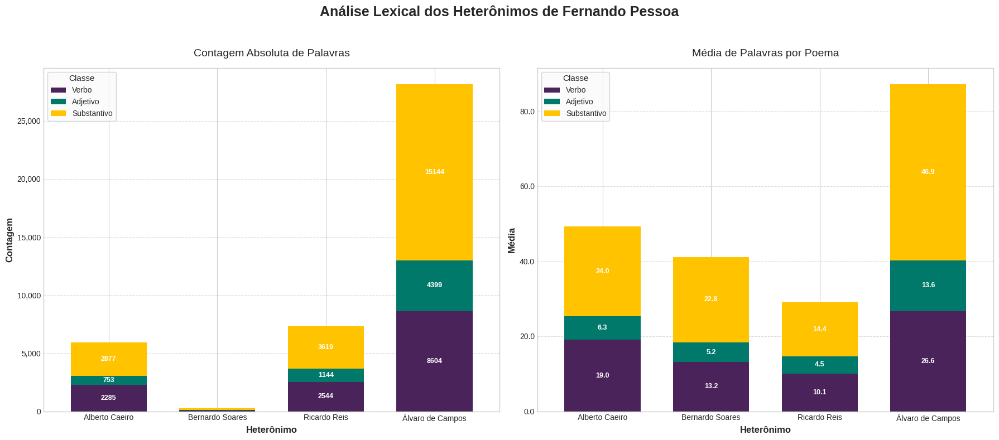

In [31]:
pos_df = pos_heteronimos.unstack(level=1)
pos_df.columns = ['Substantivo', 'Verbo', 'Adjetivo']
pos_df = pos_df[['Verbo', 'Adjetivo', 'Substantivo']]

# Calcular número de poemas por heterônimo
num_poemas = df_heteronimos.groupby('autor').size()

# Calcular média por poema
pos_media = pos_df.div(num_poemas, axis=0)

# Cores e estilo
plt.style.use('seaborn-v0_8-whitegrid')
colors = ['#4A235A', '#00796B', '#FFC300']

# --- Criar figura com 2 subplots lado a lado ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))

# Gráfico 1: Contagem absoluta
pos_df.plot(kind='bar', stacked=True, color=colors, ax=ax1, width=0.7)
ax1.set_title('Contagem Absoluta de Palavras', fontsize=14, pad=15)
ax1.set_xlabel('Heterônimo', fontsize=12, fontweight='bold')
ax1.set_ylabel('Contagem', fontsize=12, fontweight='bold')
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{int(x):,}'))
ax1.grid(axis='y', linestyle='--', alpha=0.7)
ax1.set_axisbelow(True)
for c in ax1.containers:
    ax1.bar_label(c, labels=[f'{v.get_height():.0f}' if v.get_height()>500 else '' for v in c],
                  label_type='center', color='white', fontsize=9, fontweight='bold')
ax1.legend(title='Classe', fontsize=10, title_fontsize=11, frameon=True, facecolor='#fafafa')
ax1.set_xticklabels(pos_df.index, rotation=0, ha='center')

# Gráfico 2: Média por poema
pos_media.plot(kind='bar', stacked=True, color=colors, ax=ax2, width=0.7)
ax2.set_title('Média de Palavras por Poema', fontsize=14, pad=15)
ax2.set_xlabel('Heterônimo', fontsize=12, fontweight='bold')
ax2.set_ylabel('Média', fontsize=12, fontweight='bold')
ax2.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:.1f}'))
ax2.grid(axis='y', linestyle='--', alpha=0.7)
ax2.set_axisbelow(True)
for c in ax2.containers:
    ax2.bar_label(c, labels=[f'{v.get_height():.1f}' if v.get_height()>0.5 else '' for v in c],
                  label_type='center', color='white', fontsize=9, fontweight='bold')
ax2.legend(title='Classe', fontsize=10, title_fontsize=11, frameon=True, facecolor='#fafafa')
ax2.set_xticklabels(pos_media.index, rotation=0, ha='center')

plt.suptitle('Análise Lexical dos Heterônimos de Fernando Pessoa', fontsize=18, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0,0,1,0.95])
plt.show()

## <font color="turquoise"> Modelagem de Estilo e Semântica </font>
- Calcular a riqueza lexical das poesias.
- Aplicar TF-IDF para destacar palavras mais importantes.

$$
\text{Riqueza Lexical} = \frac{\text{nº de palavras únicas}}{\text{nº total de palavras}}
$$


**1- Calcula a riqueza lexical de cada poema e tira a média:**

In [32]:
# Riqueza lexical por texto (cada linha do DF de heterônimos)
df_heteronimos['riqueza_lexical'] = df_heteronimos['tokens_lemmatizados'].apply(
    lambda x: len(set(x)) / len(x) if len(x) > 0 else 0
)

print("\nRiqueza lexical média por heterônimo:")
display(df_heteronimos.groupby('autor')['riqueza_lexical'].mean())


Riqueza lexical média por heterônimo:


,riqueza_lexical
autor,
Alberto Caeiro,0.742284
Bernardo Soares,0.845474
Ricardo Reis,0.887098
Álvaro de Campos,0.798093


**2- Junta todos os poemas de um autor antes de calcular a riqueza lexical:**

In [33]:
riqueza_lexical_heteronimos = {}

for autor in heteronimos:
    # concatena todos os tokens de um autor só
    textos_autor = [token for lista in df_heteronimos[df_heteronimos['autor'] == autor]['tokens_lemmatizados'] for token in lista]
    if textos_autor:  # evita divisão por zero
        riqueza_lexical_heteronimos[autor] = len(set(textos_autor)) / len(textos_autor)
    else:
        riqueza_lexical_heteronimos[autor] = 0

print("\nRiqueza lexical total por heterônimo:")
display(pd.Series(riqueza_lexical_heteronimos))


Riqueza lexical total por heterônimo:


,0
Alberto Caeiro,0.249809
Ricardo Reis,0.310028
Álvaro de Campos,0.221400
Bernardo Soares,0.729805


**Comparando os resultados:**

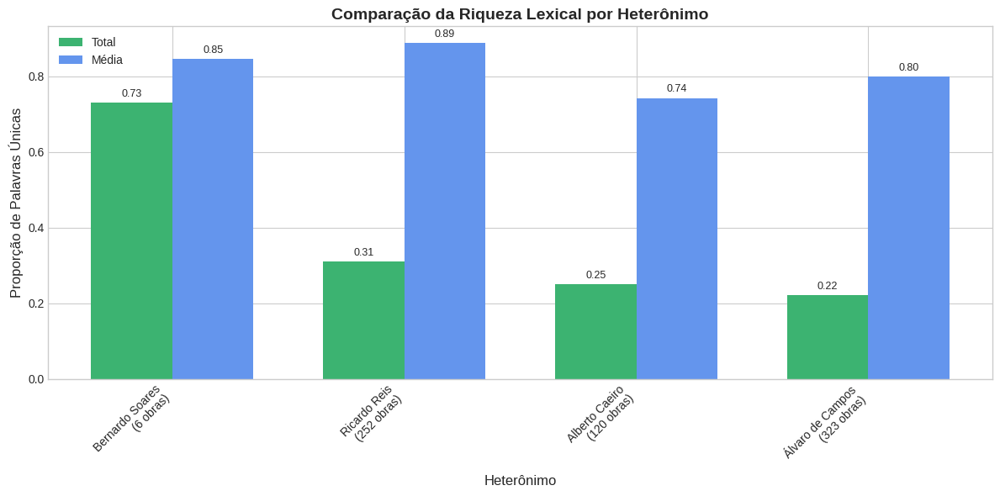

In [34]:
# Renomeando para maior clareza e consistência com os gráficos anteriores
serie_riqueza_total = pd.Series(riqueza_lexical_heteronimos).sort_values(ascending=False)
serie_riqueza_media = pd.Series(df_heteronimos[df_heteronimos['autor'].isin(heteronimos)].groupby('autor')['riqueza_lexical'].mean()).loc[serie_riqueza_total.index]

# Número de poemas para cada heterônimo a ser exibido no eixo x
num_poemas_heteronimos = df_heteronimos.groupby('autor').size().loc[serie_riqueza_total.index]
x_labels = [f'{autor}\n({num_poemas} obras)' for autor, num_poemas in num_poemas_heteronimos.items()]

x = range(len(serie_riqueza_total))
width = 0.35  # Largura das barras

plt.figure(figsize=(12, 6))
plt.bar([i - width/2 for i in x], serie_riqueza_total.values, width=width, label='Total', color='mediumseagreen')
plt.bar([i + width/2 for i in x], serie_riqueza_media.values, width=width, label='Média', color='cornflowerblue')

# Título e rótulos
plt.title('Comparação da Riqueza Lexical por Heterônimo', fontsize=14, fontweight='bold')
plt.xlabel('Heterônimo', fontsize=12)
plt.ylabel('Proporção de Palavras Únicas', fontsize=12)
plt.xticks(x, x_labels, rotation=45, ha='right')

# Exibir valores acima das barras
for i in x:
    plt.text(i - width/2, serie_riqueza_total.values[i] + 0.01, f'{serie_riqueza_total.values[i]:.2f}', ha='center', va='bottom', fontsize=9)
    plt.text(i + width/2, serie_riqueza_media.values[i] + 0.01, f'{serie_riqueza_media.values[i]:.2f}', ha='center', va='bottom', fontsize=9)

plt.legend()
plt.tight_layout()
plt.show()

Quanto maior o número de obras, maior a diferença entre a riqueza média por obra e a riqueza total. Isso acontece porque palavras comuns aos textos (mesmos termos, conectores, nomes próprios recorrentes) aparecem várias vezes no conjunto total, diminuindo a proporção de palavras únicas.

No caso de poucos textos (como Bernardo Soares), a diferença entre total e média é menor.



---



**TF-IDF (Frequência do Termo e Frequência inversa do Documento)**

Precisa juntar os tokens lematizados em uma string porque o TfidfVectorizer do scikit-learn não aceita listas de palavras, ele espera cada documento como um único texto (string).

In [35]:
# Juntar os tokens lematizados em strings para TF-IDF
df_heteronimos['texto_lemmatizado_str'] = df_heteronimos['tokens_lemmatizados'].apply(lambda x: ' '.join(x))

# Inicializar TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(min_df=5, max_df=0.95, use_idf=True, norm="l2")

# Aplicar TF-IDF
tfidf_matrix = tfidf_vectorizer.fit_transform(df_heteronimos['texto_lemmatizado_str'])

print("Matriz TF-IDF criada com sucesso (apenas para heterônimos):")
print(tfidf_matrix.shape)

Matriz TF-IDF criada com sucesso (apenas para heterônimos):
(701, 1491)


◽ min_df=5: ignora termos muito raros (presentes em menos de 5 documentos).

◽ max_df=0.95: ignora termos muito comuns (presentes em mais de 95% dos documentos).

◽ use_idf=True: usa a ponderação IDF (padrão).

◽ norm="l2": normaliza cada vetor (padrão).

In [36]:
# Converte em array e mostra como DataFrame com nomes das palavras
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
display(tfidf_df.head())

,abaixo,abandonar,abismo,abrir,absolutamente,absoluto,abstracto,absurdo,absurr,acabar,...,voltar,volver,vontade,vosso,vou,voz,vulgar,vulto,walt,whitman
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.284488,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0


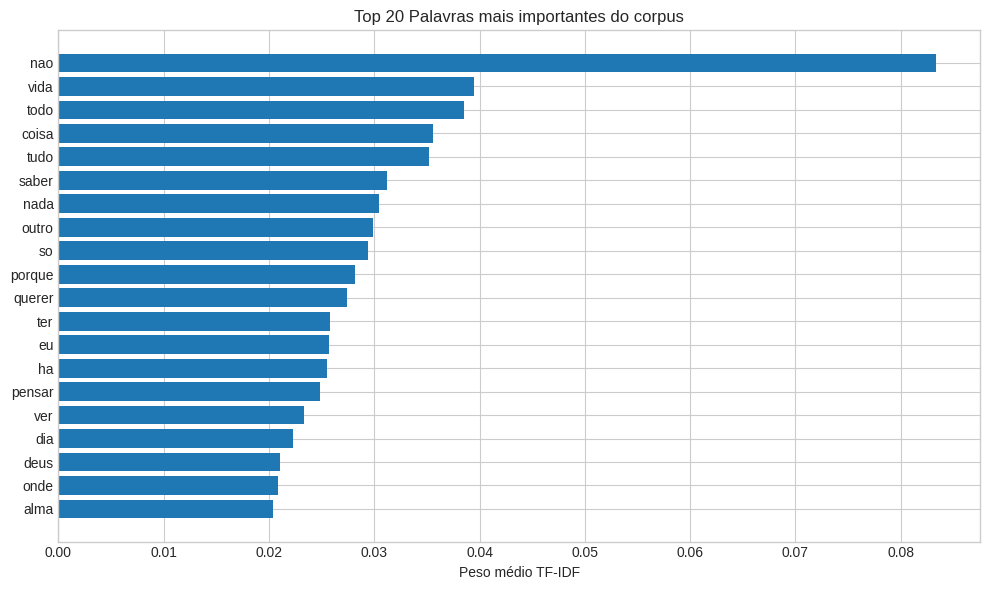

In [37]:
# Extrair os termos do vocabulário
terms = tfidf_vectorizer.get_feature_names_out()

# Calcular o peso médio de cada termo no corpus (soma ou média ao longo dos documentos)
mean_tfidf = np.asarray(tfidf_matrix.mean(axis=0)).ravel()

# Colocar em um DataFrame para facilitar
df_tfidf = pd.DataFrame({
    'termo': terms,
    'peso_medio': mean_tfidf
})

# Pegar as 20 palavras mais importantes
df_top = df_tfidf.sort_values(by='peso_medio', ascending=False).head(20)

# Plotar gráfico de barras
plt.figure(figsize=(10,6))
plt.barh(df_top['termo'][::-1], df_top['peso_medio'][::-1])  # [::-1] para inverter e mostrar maior no topo
plt.xlabel('Peso médio TF-IDF')
plt.title(f'Top 20 Palavras mais importantes do corpus')
plt.tight_layout()
plt.show()

## <font color="turquoise"> Modelos de Classificação </font>
- Criar um classificador para tentar identificar quem escreveu um poema com base nas características do texto.

Preparação dos dados utilizando **TF-IDF (Term Frequency - Inverse Document Frequency)**:

In [38]:
# Criar as features (X) e labels (y)
X = tfidf_matrix
y = df_heteronimos['autor']

O conjunto de dados possui um <font color='red'>**desbalanceamento extremo**</font>, com pouquíssimas amostras de Bernardo Soares, o que impede o modelo de aprender seus padrões. A baixa performance reflete essa falta de dados, sendo necessário coletar mais textos ou aplicar técnicas de aumento para melhorar os resultados.

In [39]:
y.value_counts()

,count
autor,
Álvaro de Campos,323
Ricardo Reis,252
Alberto Caeiro,120
Bernardo Soares,6


Divisão dos dados em treino e teste e configuração de múltiplos modelos de classificação com tratamento de classes desbalanceadas:


In [40]:
# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Inicializar e treinar diferentes modelos de Classificação
models = {
    "Regressão Logística": LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced'),
    "SVM Linear": LinearSVC(random_state=42, dual=False, class_weight='balanced'),
    "Random Forest": RandomForestClassifier(random_state=42, class_weight='balanced'),
    "Decision Tree": DecisionTreeClassifier(random_state=42, class_weight='balanced'),
    "Naive Bayes Multinomial": MultinomialNB(),
    "KNN": KNeighborsClassifier(n_neighbors=5, weights='distance')
}

In [41]:
# ------------------------------
# Treinamento e cálculo de métricas
# ------------------------------
rows = []
for name, model in models.items():
    print(f"Treinando {name}...")
    model.fit(X_train, y_train)

    # Previsões são feitas apenas uma vez para cada conjunto
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Adiciona o dicionário de resultados diretamente
    rows.append({
        'Modelo': name,
        'Acurácia Treino': accuracy_score(y_train, y_train_pred),
        'Acurácia Teste': accuracy_score(y_test, y_test_pred),
        'F1 Treino': f1_score(y_train, y_train_pred, average='weighted'),
        'F1 Teste': f1_score(y_test, y_test_pred, average='weighted'),
        'Precisão Teste': precision_score(y_test, y_test_pred, average='weighted', zero_division=0),
        'Recall Teste': recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
    })

results_df = pd.DataFrame(rows)

# ------------------------------
# Estilização do DataFrame (Ajustado)
# ------------------------------
metric_cols = [col for col in results_df.columns if col != 'Modelo']

cores_modelo = {
    'Regressão Logística': '#d62728', # Vermelho
    'SVM Linear': '#1f77b4',          # Azul
    'Random Forest': '#2ca02c',       # Verde
    'Decision Tree': '#ff7f0e',       # Laranja
    'Naive Bayes Multinomial': '#9467bd', # Roxo
    'KNN': '#8c564b'  # Marrom
}

def color_model_background(val):
    cor = cores_modelo.get(val, "black")
    return f'background-color: {cor}; color: white; font-weight: bold'

styled_df = (results_df.style
             # Aplica a função para colorir o FUNDO da célula do modelo
             .map(color_model_background, subset=['Modelo'])

             .format("{:.4f}", subset=metric_cols)
             .set_caption("Resultados dos Modelos de Classificação")
             .set_properties(**{'text-align': 'center'})
            )

display(styled_df)

Treinando Regressão Logística...
Treinando SVM Linear...
Treinando Random Forest...
Treinando Decision Tree...
Treinando Naive Bayes Multinomial...
Treinando KNN...


,Modelo,Acurácia Treino,Acurácia Teste,F1 Treino,F1 Teste,Precisão Teste,Recall Teste
0,Regressão Logística,0.9786,0.8440,0.9786,0.8394,0.8379,0.8440
1,SVM Linear,0.9982,0.8511,0.9982,0.8468,0.8443,0.8511
2,Random Forest,1.0000,0.7872,1.0000,0.7659,0.7934,0.7872
3,Decision Tree,1.0000,0.5745,1.0000,0.5759,0.5810,0.5745
4,Naive Bayes Multinomial,0.8375,0.7660,0.8048,0.7113,0.8148,0.7660
5,KNN,1.0000,0.7234,1.0000,0.7130,0.7250,0.7234


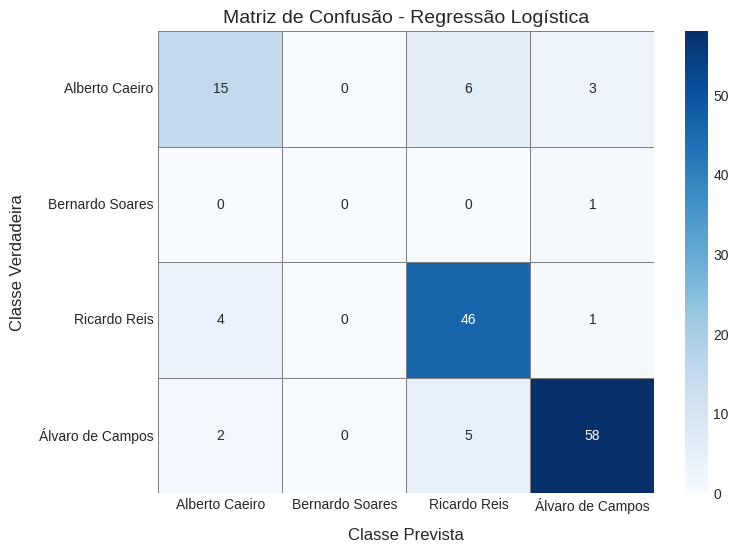

In [42]:
# Previsão do modelo de Regressão Logística
y_test_pred = models['Regressão Logística'].predict(X_test)

# Criar a matriz de confusão
cm = confusion_matrix(y_test, y_test_pred, labels=models['Regressão Logística'].classes_)

# Transformar em DataFrame para melhorar a visualização
cm_df = pd.DataFrame(cm, index=models['Regressão Logística'].classes_, columns=models['Regressão Logística'].classes_)

# Plotar usando seaborn
plt.figure(figsize=(8,6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=True, linewidths=0.5, linecolor='gray')
plt.title("Matriz de Confusão - Regressão Logística", fontsize=14)
plt.ylabel("Classe Verdadeira", fontsize=12, labelpad=10)
plt.xlabel("Classe Prevista", fontsize=12, labelpad=10)
plt.yticks(rotation=0)
plt.show()